In [109]:
from PIL import Image, ImageFilter, ImageChops
import numpy as np
import matplotlib.pyplot as plt

Zadanie 1: funkcja "filtruj"

In [110]:
def filtruj(obraz, kernel, scale=1):
    kernel_size = int(len(kernel) ** 0.5)
    kernel_filter = ImageFilter.Kernel(size=(kernel_size, kernel_size), kernel=kernel, scale=scale)
    return obraz.filter(kernel_filter)

Zadanie 2: Funkcja BLUR

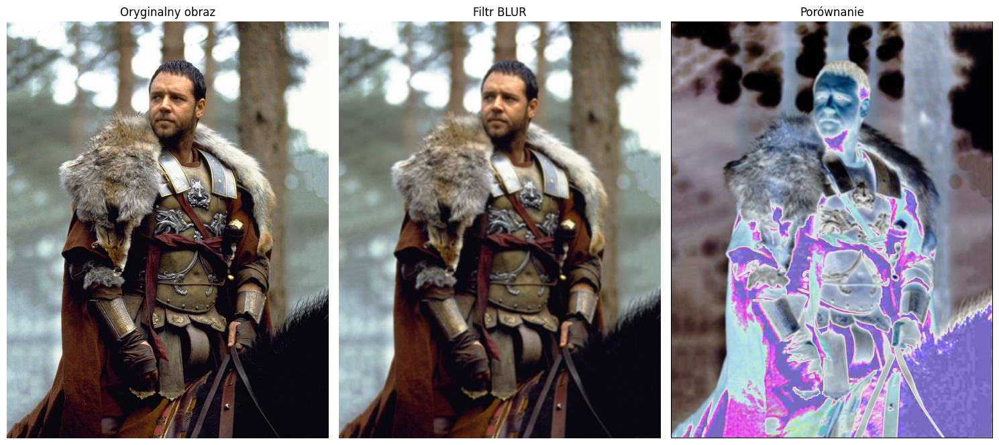

In [111]:
obraz = Image.open('maximus-gladiator.jpg').convert('RGB')

im_blur = obraz.filter(ImageFilter.BLUR)

blur_kernel = ImageFilter.BLUR.filterargs[3]
blur_scale = 1


im_blur_custom = filtruj(obraz, blur_kernel, scale=blur_scale)

comparison = ImageChops.difference(im_blur, im_blur_custom)

plt.figure(figsize=(15, 10))
plt.subplot(1, 3, 1)
plt.imshow(obraz)
plt.title("Oryginalny obraz")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(im_blur)
plt.title("Filtr BLUR")
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(comparison)
plt.title("Porównanie")
plt.axis('off')

plt.tight_layout()

plt.savefig("fig1.png")
plt.show()


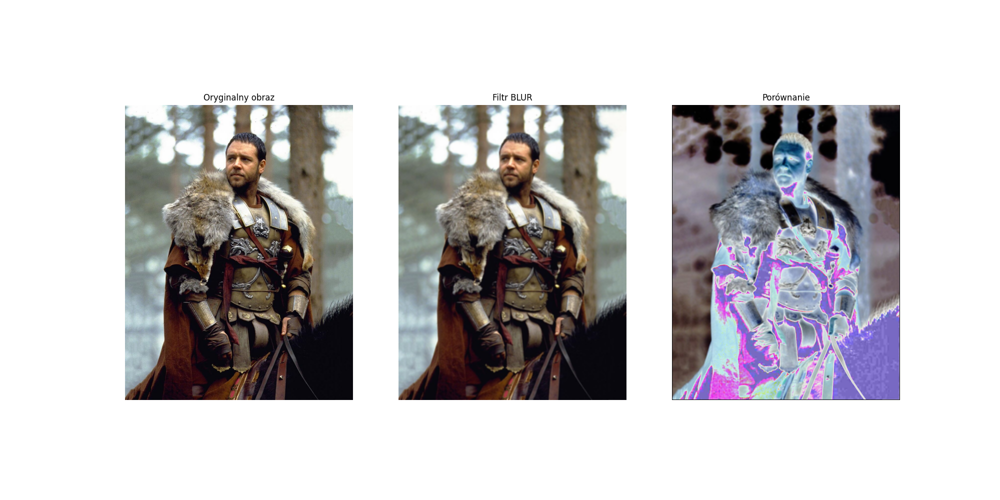

Zad. 3: SOBEL

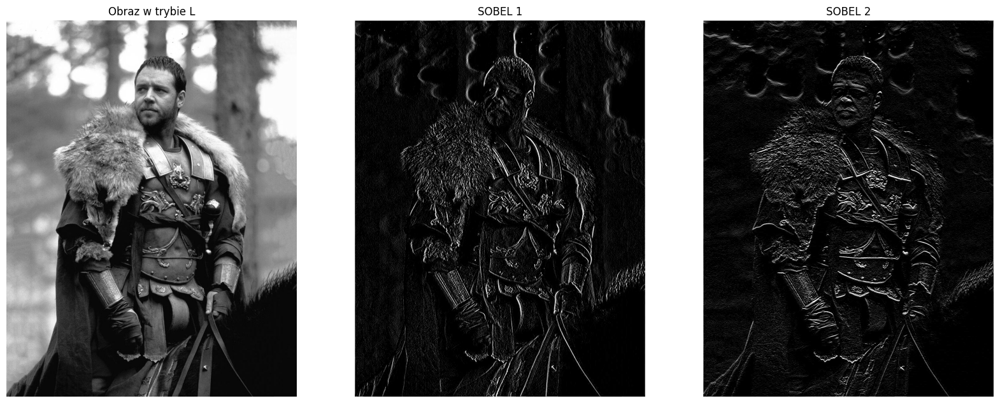

In [112]:
im_gray = obraz.convert('L')

#Filtr EMBOSS
im_emboss = im_gray.filter(ImageFilter.EMBOSS)

#Sobel1 i Sobel2
sobel1_kernel = (-1, 0, 1, -2, 0, 2, -1, 0, 1)
sobel2_kernel = (-1, -2, -1, 0, 0, 0, 1, 2, 1)

im_sobel1 = filtruj(im_gray, sobel1_kernel)
im_sobel2 = filtruj(im_gray, sobel2_kernel)


plt.figure(figsize=(20, 10))
plt.subplot(1, 3, 1)
plt.imshow(im_gray, cmap='gray')
plt.title("Obraz w trybie L")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(im_sobel1, cmap='gray')
plt.title("SOBEL 1")
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(im_sobel2, cmap='gray')
plt.title("SOBEL 2")
plt.axis('off')

plt.savefig("fig2.png")
plt.show()


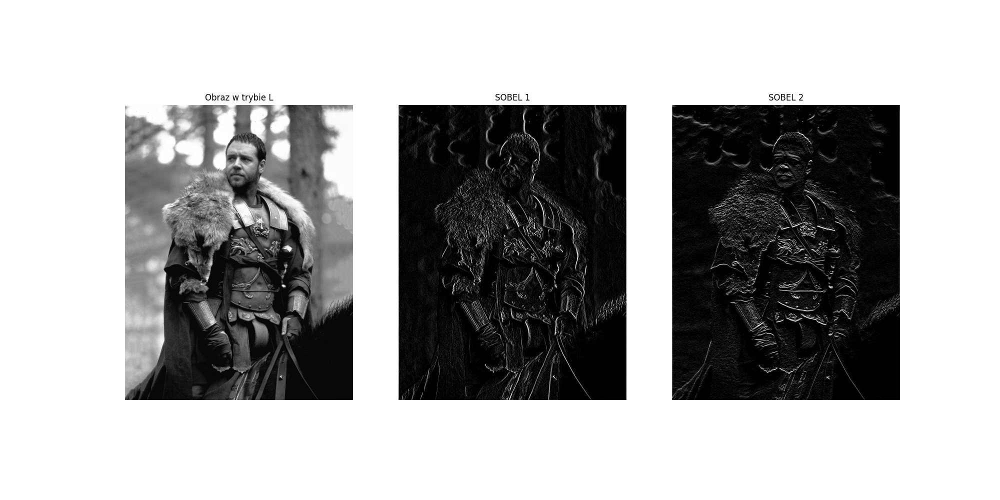

Zad. 4: Filtry: DETAIL, EDGE_ENHANCE, SHARPEN, SMOOTH

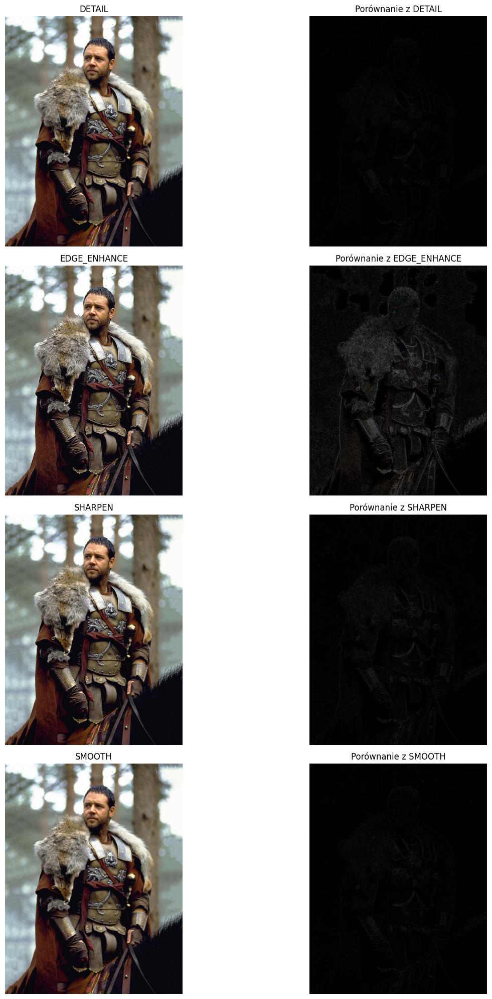

In [113]:
filters = [ImageFilter.DETAIL, ImageFilter.EDGE_ENHANCE, ImageFilter.SHARPEN, ImageFilter.SMOOTH]
filter_names = ["DETAIL", "EDGE_ENHANCE", "SHARPEN", "SMOOTH"]

plt.figure(figsize=(15, 20))
for i, f in enumerate(filters, start=1):
    filtered_image = obraz.filter(f)
    comparison = ImageChops.difference(obraz, filtered_image)

    plt.subplot(4, 2, 2 * i - 1)
    plt.imshow(filtered_image)
    plt.title(filter_names[i - 1])
    plt.axis('off')

    plt.subplot(4, 2, 2 * i)
    plt.imshow(comparison)
    plt.title(f"Porównanie z {filter_names[i - 1]}")
    plt.axis('off')

plt.tight_layout()
plt.savefig("fig3.png")
plt.show()


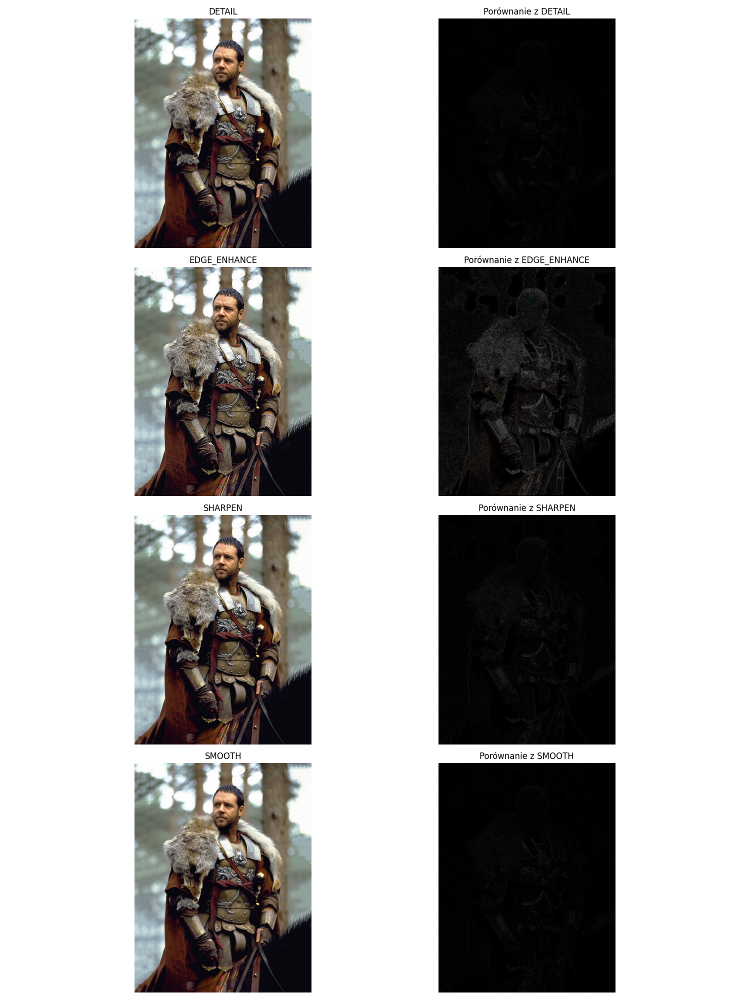

Zad. 5 Filtry:
11.BoxBlur
12.GaussianBlur
13.UnsharpMask
14.Kernel
15.RankFilter
16.MedianFilter
17.MinFilter
18.MaxFilter

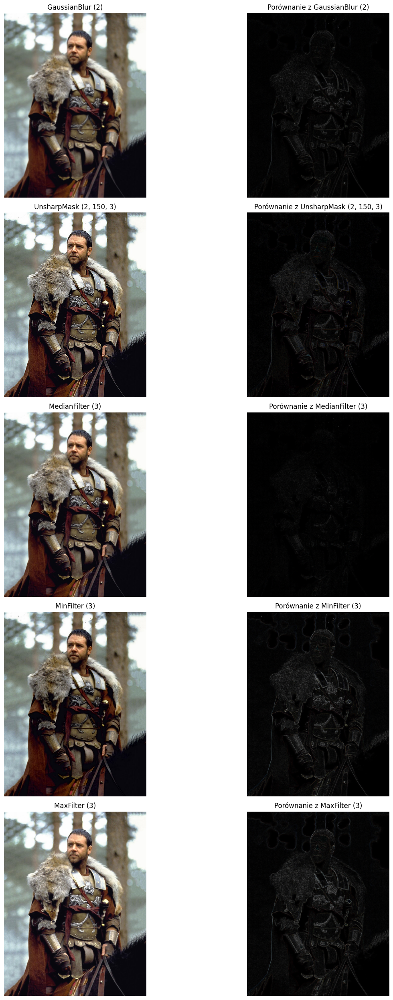

In [114]:
custom_filters = [
    (ImageFilter.GaussianBlur(2), "GaussianBlur (2)"),
    (ImageFilter.UnsharpMask(radius=2, percent=150, threshold=3), "UnsharpMask (2, 150, 3)"),
    (ImageFilter.MedianFilter(size=3), "MedianFilter (3)"),
    (ImageFilter.MinFilter(size=3), "MinFilter (3)"),
    (ImageFilter.MaxFilter(size=3), "MaxFilter (3)")
]

plt.figure(figsize=(15, 25))
for i, (f, name) in enumerate(custom_filters, start=1):
    filtered_image = obraz.filter(f)
    comparison = ImageChops.difference(obraz, filtered_image)

    plt.subplot(5, 2, 2 * i - 1)
    plt.imshow(filtered_image)
    plt.title(name)
    plt.axis('off')

    plt.subplot(5, 2, 2 * i)
    plt.imshow(comparison)
    plt.title(f"Porównanie z {name}")
    plt.axis('off')

plt.tight_layout()
plt.savefig("fig4.png")
plt.show()


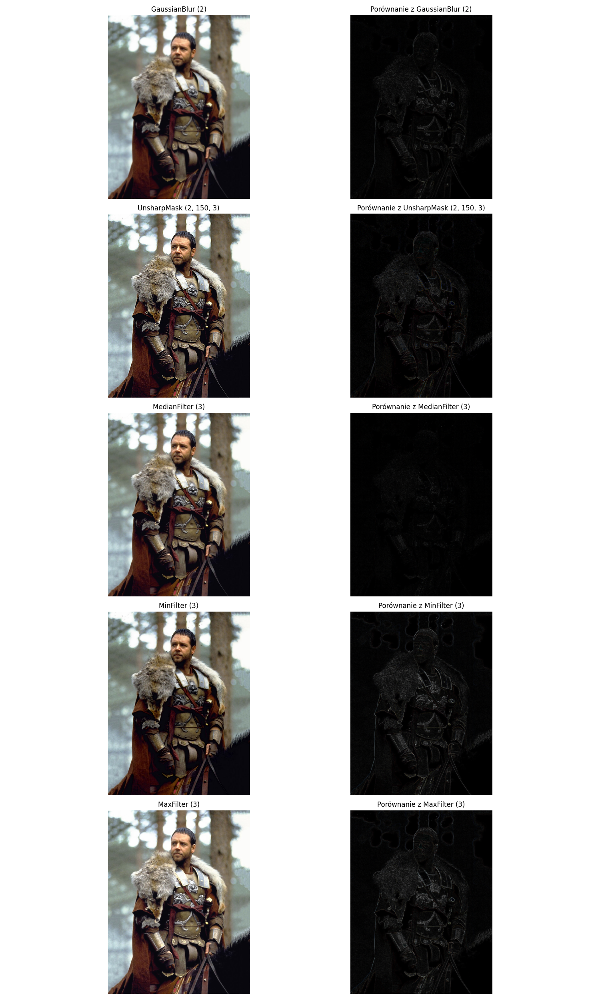